<a href="https://colab.research.google.com/github/NicKostii/UniProjects/blob/main/IDA/Lab_work_4_(IDA).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Лабороторна робота №4
Тема: Кластеризацiя засобами бiблiотеки Scikit-Learn

Варіант 1   

Тюкалов Ніколай КА-13

# Хiд виконання роботи:
1. Представити початковi данi графiчно.
2. Побудувати модель кластеризацiї згiдно з варiантом.
3. Виконати кластеризацiю даних на основi моделi.

4. Представити розбиття на кластери графiчно, наприклад, рiзними кольорами.

5. Розрахувати час кластеризацiї. Оцiнити швидкодiю методу на надвеликих наборах даних (наприклад, при збiльшеннi кiлькостi точок даних до ста тисяч i бiльше).
6. Побудувати кiлька альтернативних моделей:

  • шляхом змiни значень параметрiв основної моделi,

  • використати рiзнi функцiї вiдстанi в алгоритмах, де це можна зробити,

  • задати рiзнi значення кiлькостi кластерiв, в алгоритмах де кiлькiсть
кластерiв - параметр.

7. Для кожної альтернативної моделi розрахувати метрики якостi кластеризацiї, що реалiзованi в модулi sklearn.metrics (тiльки метрики згiдно з варiантом):

  • Homogeneity.

  • Completeness.

  • V-measure.

8. Виконати аналiз результатiв кластеризацiї одним з неформальних методiв (тiльки методом згiдно з варiантом):

  • чи є розбиття стабiльним на пiдвибiрках даних,

9. Вищенаведенi пункти виконати для заданих двох наборiв даних рiзної
форми.
10. Зробити висновки про якiсть роботи моделей на дослiджених даних та
про швидкодiю методу.
11. Оцiнити результати кластеризацiї на основi метрик якостi та на основi
неформальних методiв. У кожному варiантi задано два набори даних.
Спробувати пiдiбрати найкращу модель кластеризацiї для кожного набору даних.

# Завдання

 Алгоритм роздiлу сумiшi expectation-maximization (EM), GaussianMixture та BayesianGaussianMixture модулю sklearn.mixture.

Метрики якостi: Homogeneity, Completeness, V-measure.

Чи є розбиття стабiльним на пiдвибiрках даних?

# Початкові дані

(а)

    sklearn.datasets.make_moons

(b)

    import numpy as np
    np.random.seed(0)
    n_points_per_cluster = 10000
    C1 = [ −6, −2] + 0.7 ∗ np.random randn(n_points_per_cluster, 2)
    C2 = [ −2,  2] + 0.3 ∗ np.random.randn(n_points_per_cluster, 2)
    C3 = [  1, −2] + 0.2 ∗ np.random.randn(n_points_per_cluster, 2)
    C4 = [  4, −4] + 0.1 ∗ np.random.randn(n_points_per_cluster, 2)
    C5 = [  5,  0] + 1.4 ∗ np.random.randn(n_points_per_cluster, 2)
    C6 = [  5,  6] + 2.0 ∗ np.random.randn(n_points_per_cluster, 2)
    X = np.vstack((C1, C2, C3, C4, C5, C6))

# Нобхідні бібліотеки

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score
from sklearn.datasets import make_moons
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture

# Перший датасет

## Генерація даних

In [ ]:
X, y = make_moons(n_samples=1000, noise=0.1, random_state=42)

## Графічне представлення даних

(<Axes: >,)

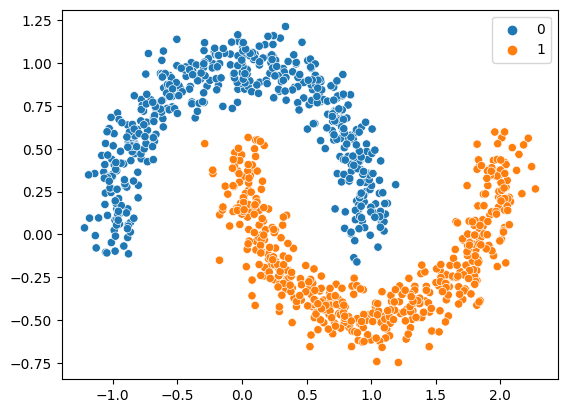

In [ ]:
sns.scatterplot(x = X[:, 0], y = X[:, 1], hue = y),

## Побудова моделей

В моєму варіанту вкзано, що треба бдувати дві моделі:  
 - GaussianMixture,  
 - BayesianGaussianMixture.  

Відповідно, буде побудовано дві моделі в кожному кроці.  

**Важливо зауважити**, що я не буду використовувати **не** необхідні параметри обох моделей на цьому кроці та спеціально створю дві максимально прості. Експерементування з параметрами та спроба побудувати гарну модель буде в відповідному розіді далі.

### GaussianMixture

In [ ]:
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(X)

GaussianMixture(n_components=2, random_state=42)

### BayesianGaussianMixture

In [ ]:
bgmm = BayesianGaussianMixture(n_components=2, random_state=42)
bgmm.fit(X)

BayesianGaussianMixture(n_components=2, random_state=42)

## Кластерізація

### GaussianMixture

In [ ]:
clusters_gmm = gmm.predict(X)

### BayesianGaussianMixture

In [ ]:
clusters_bgmm = bgmm.predict(X)

## Візуалізація

Я створив декілька моделей, з єдиною відмінністю в кількості заданих кластерів, для порівняння та демонстарції того, як моделі виконує завдання кластерізації.

### GaussianMixture

Можно побачити, що GM модель не найкращий вибір для кластерізації даних типу make_moon, не підходить для датасетів з комплексоною структурою.

In [ ]:
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm, palette="Set1")
plt.title('Девять кластерів')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

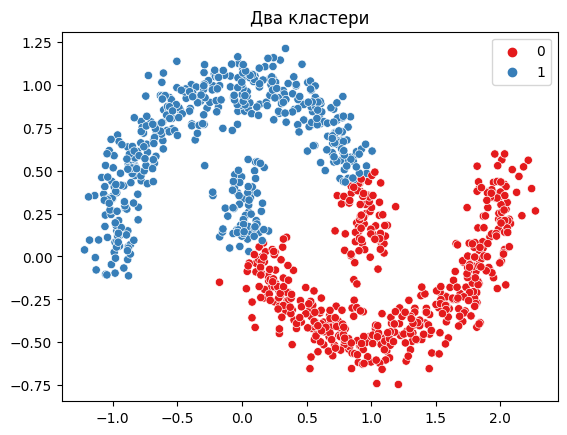

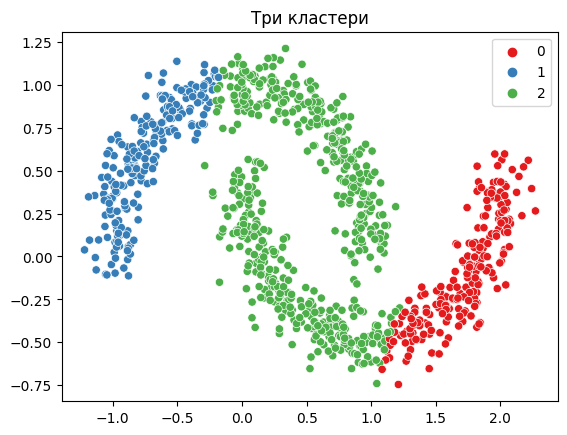

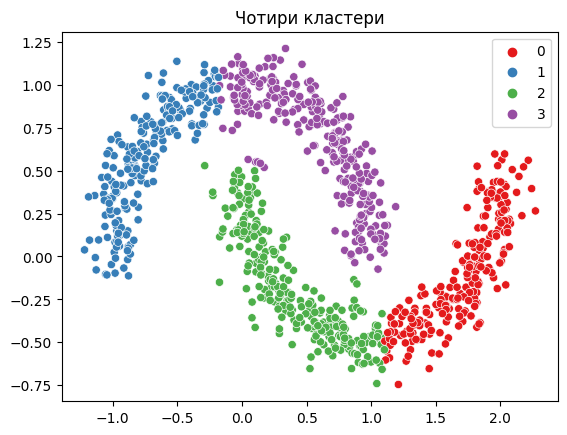

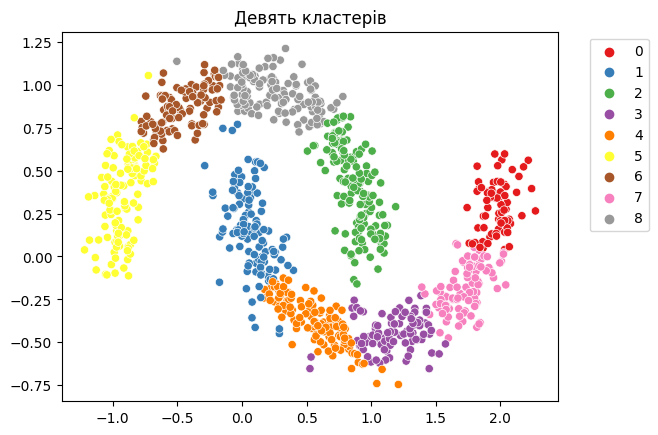

### BayesianGaussianMixture

Нижче можна побачити, що результати дуже схожі, майже однакові.
Ну, насправід ключовою відмінністю є використання бєасовсього піхіду заміть MLE пфдходу. Саме з цього й випливають можливості оптимізовувати кількість кластерів, бачити більш приховану структуру даних. Це краще можна побачити на реальних датасетах. Цей датасет дуже простий, тому BayesianGaussianMixture не може продемонструвати весь потенціал.

In [ ]:
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm, palette="Set1")
plt.title('Девять кластерів')

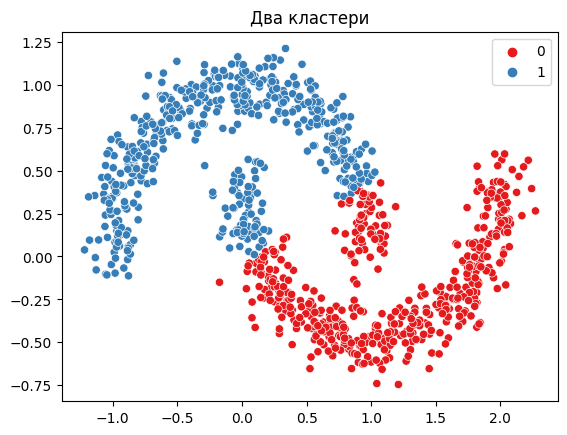

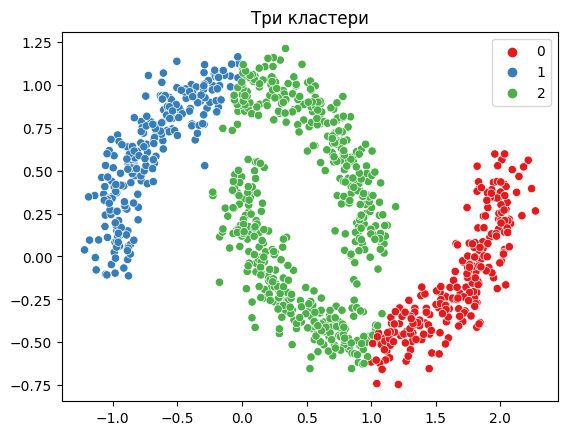

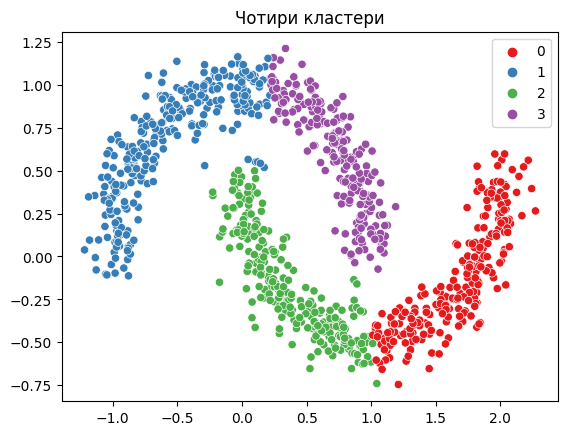

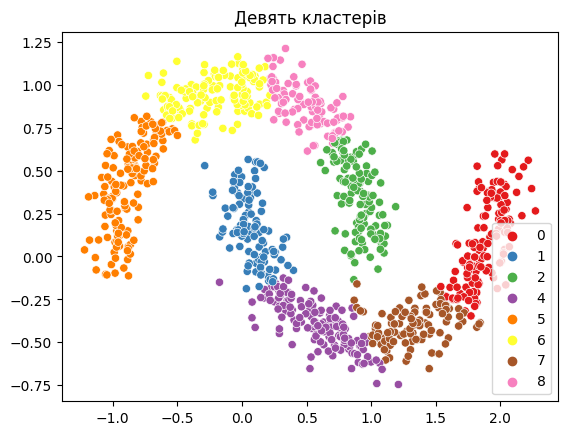

## Оцінка часу
В цьому розілі я створю декілька датасетів make_moons з різними розмірами: 1000, 5000, 10000, 50000, 100000. Буде заміряний час.

### Бібліотека для заміру часу

In [ ]:
import time

### GaussianMixture

In [ ]:
time_dict = {}
for cap in range(10000, 210000, 10000):

  X_t, y_t = make_moons(n_samples=cap, noise=0.1, random_state=42)

  start_time = time.time()

  gmm_t = GaussianMixture(n_components=2, random_state=42, max_iter = 1000)
  gmm_t.fit(X_t)
  clusters_gmm_t = gmm_t.predict(X_t)

  end_time = time.time()
  elapsed_time = end_time - start_time
  time_dict[cap] = elapsed_time

  print(f"Час виконання для розміру {cap}: {end_time - start_time} секунд")

Час виконання для розміру 10000: 0.05185270309448242 секунд
Час виконання для розміру 20000: 0.19572210311889648 секунд
Час виконання для розміру 30000: 0.11613893508911133 секунд
Час виконання для розміру 40000: 0.202805757522583 секунд
Час виконання для розміру 50000: 0.2011556625366211 секунд
Час виконання для розміру 60000: 0.2701416015625 секунд
Час виконання для розміру 70000: 0.39594531059265137 секунд
Час виконання для розміру 80000: 0.5423135757446289 секунд
Час виконання для розміру 90000: 0.4395008087158203 секунд
Час виконання для розміру 100000: 0.9576053619384766 секунд
Час виконання для розміру 110000: 0.9633955955505371 секунд
Час виконання для розміру 120000: 0.9208290576934814 секунд
Час виконання для розміру 130000: 1.294806957244873 секунд
Час виконання для розміру 140000: 1.2297508716583252 секунд
Час виконання для розміру 150000: 1.1336934566497803 секунд
Час виконання для розміру 160000: 0.8359684944152832 секунд
Час виконання для розміру 170000: 0.92324876785278

### BayesianGaussianMixture

In [ ]:
time_dict_2 = {}
for cap in range(10000, 210000, 10000):

  X_t, y_t = make_moons(n_samples=cap, noise=0.1, random_state=42)

  start_time = time.time()

  bgmm_t = BayesianGaussianMixture(n_components=2, random_state=42, max_iter = 1000)
  bgmm_t.fit(X_t)
  clusters_bgmm_t = bgmm_t.predict(X_t)

  end_time = time.time()
  elapsed_time = end_time - start_time
  time_dict_2[cap] = elapsed_time

  print(f"Час виконання для розміру {cap}: {end_time - start_time} секунд")

Час виконання для розміру 10000: 1.8804850578308105 секунд
Час виконання для розміру 20000: 0.27908873558044434 секунд
Час виконання для розміру 30000: 2.9780821800231934 секунд
Час виконання для розміру 40000: 5.507551193237305 секунд
Час виконання для розміру 50000: 5.6757354736328125 секунд
Час виконання для розміру 60000: 1.9882786273956299 секунд
Час виконання для розміру 70000: 13.798535585403442 секунд
Час виконання для розміру 80000: 1.3298728466033936 секунд
Час виконання для розміру 90000: 22.774147987365723 секунд
Час виконання для розміру 100000: 1.3489840030670166 секунд
Час виконання для розміру 110000: 18.159941911697388 секунд
Час виконання для розміру 120000: 15.234030485153198 секунд
Час виконання для розміру 130000: 17.23839569091797 секунд
Час виконання для розміру 140000: 11.67438817024231 секунд
Час виконання для розміру 150000: 14.4723060131073 секунд
Час виконання для розміру 160000: 23.189449310302734 секунд
Час виконання для розміру 170000: 2.7787322998046875 

Графічне порівняння

In [ ]:
df_gmm = pd.DataFrame(list(time_dict.items()), columns=['Samples', 'Time'])
df_gmm['Model'] = 'GaussianMixture'

df_bgmm = pd.DataFrame(list(time_dict_2.items()), columns=['Samples', 'Time'])
df_bgmm['Model'] = 'BayesianGaussianMixture'

df = pd.concat([df_gmm, df_bgmm])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, '10000'),
  Text(1, 0, '20000'),
  Text(2, 0, '30000'),
  Text(3, 0, '40000'),
  Text(4, 0, '50000'),
  Text(5, 0, '60000'),
  Text(6, 0, '70000'),
  Text(7, 0, '80000'),
  Text(8, 0, '90000'),
  Text(9, 0, '100000'),
  Text(10, 0, '110000'),
  Text(11, 0, '120000'),
  Text(12, 0, '130000'),
  Text(13, 0, '140000'),
  Text(14, 0, '150000'),
  Text(15, 0, '160000'),
  Text(16, 0, '170000'),
  Text(17, 0, '180000'),
  Text(18, 0, '190000'),
  Text(19, 0, '200000')])

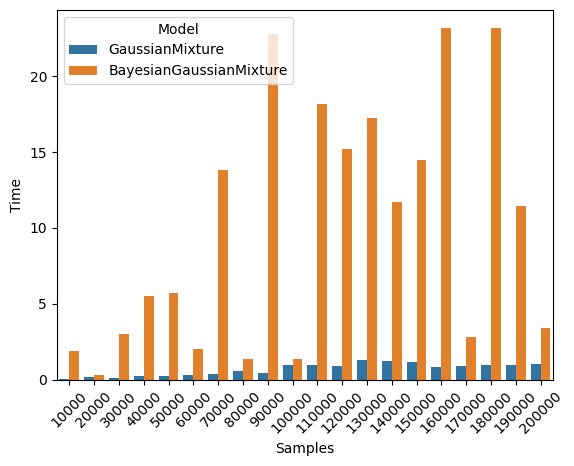

In [ ]:
sns.barplot(x='Samples', y='Time', data=df, hue = 'Model')
plt.xticks(rotation=45)

Можно побачити, що BayesianGaussianMixture стабільно займає значно більше часу, ніж GaussianMixture. Також можно побачити якісь дивні затримки та пришвидшення для BayesianGaussianMixture. Я прогнав цей тест декілька разів, але це відбуваєтсья стабільно з'являються.  
 **Отже BayesianGaussianMixture менш сатбільний за часом ніж GaussianMixture та займає значно більше часу.**

## Побудова алтернативних моделей

### GaussianMixture
Тут з цікавих параметрів covariance_type, init_params та, звичайно, n_components.

Якщо експерементувати з параметром covariance_type, то ми отримаємо для 'spherical', 'tied' та 'daig' ситуацію як нижче. Якщо брати як приклад саме те,що ми отримали нижче, то 1 та 2 кластер є на обох місяців, що, очевидно, є поганою кластерізацеєю для наших даних, так як ми знаємо як виглядає ідеальна кластерізація.

<Axes: >

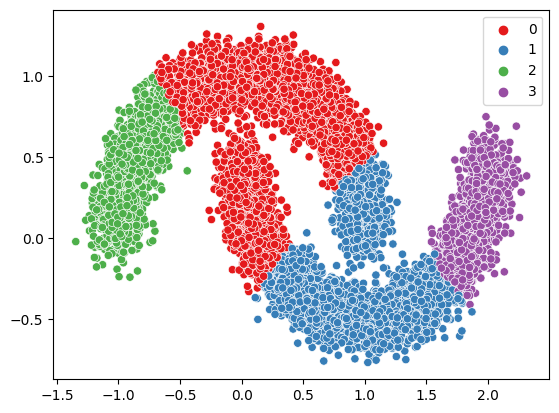

In [ ]:
gmm_1 = GaussianMixture(n_components=4, random_state=42, max_iter = 1000, covariance_type= 'spherical', init_params = 'k-means++')
gmm_1.fit(X)
clusters_gmm_1 = gmm_1.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_1, palette="Set1")

Якщо, наприклад збільшити кількість кластерів чи змінити init_params, то проблема залтшаєтсья

<Axes: >

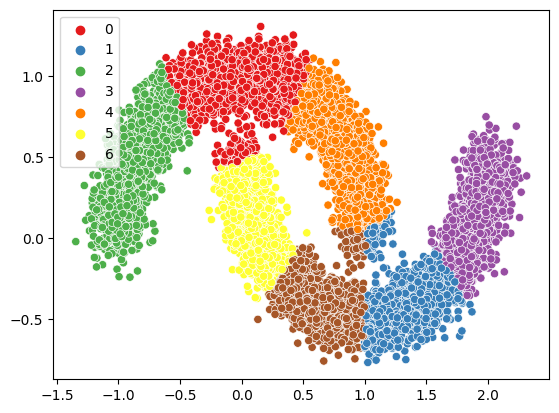

In [ ]:
gmm_2 = GaussianMixture(n_components=7, random_state=42, max_iter = 1000, covariance_type= 'tied', init_params = 'kmeans')
gmm_2.fit(X)
clusters_gmm_2 = gmm_2.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_2, palette="Set1")

covariance_type= 'full' це напевно найкращий варіант для нашого випадку. Нижче можна об'єднати кластери 1 та 2, 0 та 3, після чого ми отримаємо дуже непогану кластерізацію.

<Axes: >

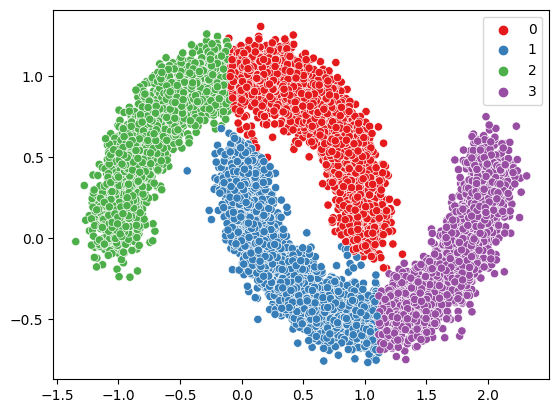

In [ ]:
gmm_3 = GaussianMixture(n_components=4, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'kmeans')
gmm_3.fit(X)
clusters_gmm_3 = gmm_3.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_3, palette="Set1")

Ця особливість досить консистна, якщо використовувати init_params = 'k-means++' або init_params = 'kmeans'. Параметр kmeans виглядає краще за k-means++.

<Axes: >

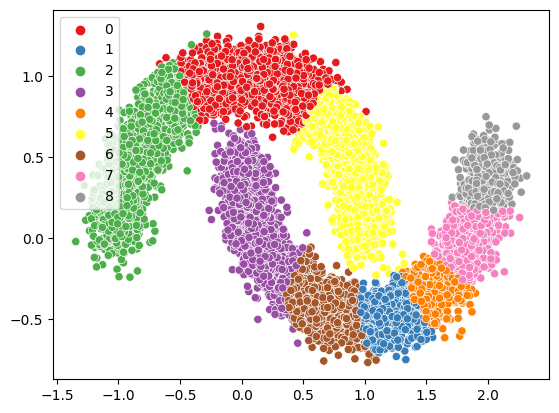

In [ ]:
gmm_4 = GaussianMixture(n_components=9, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'k-means++')
gmm_4.fit(X)
clusters_gmm_4 = gmm_4.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_4, palette="Set1")

При init_params = 'random' відбувається дещо цікаве, ми отримали 3 класетри замість 4 та місяці "змішуються".

<Axes: >

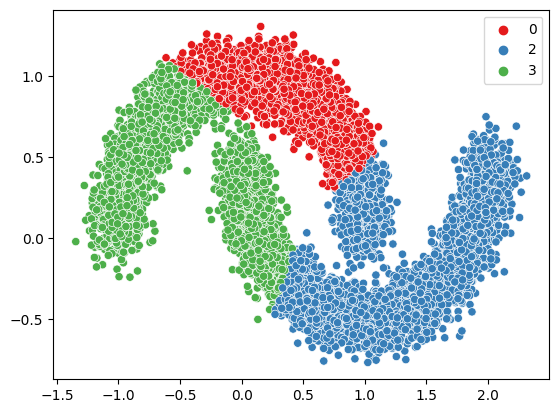

In [ ]:
gmm_5 = GaussianMixture(n_components=4, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'random')
gmm_5.fit(X)
clusters_gmm_5 = gmm_5.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_5, palette="Set1")

random_from_data робить набагато краще, в цілому схоже за результатом на kmeans та k_means++.

<Axes: >

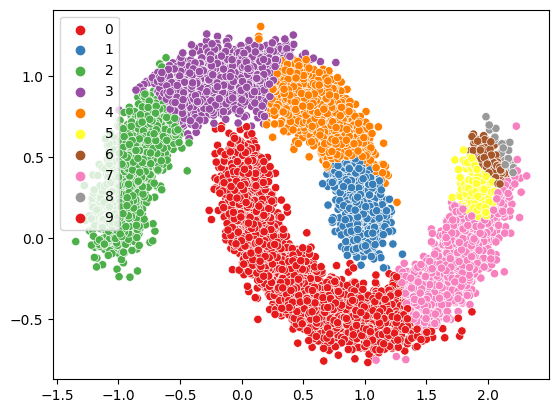

In [ ]:
gmm_5 = GaussianMixture(n_components=10, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'random_from_data')
gmm_5.fit(X)
clusters_gmm_5 = gmm_5.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_5, palette="Set1")

Також дуже важливл правильно обрати кількість кластерів. На картинці знизу ми ніяким чином не можемо об'єднати кластери так, щоб кластерізація була наближена до оптимальної.

<Axes: >

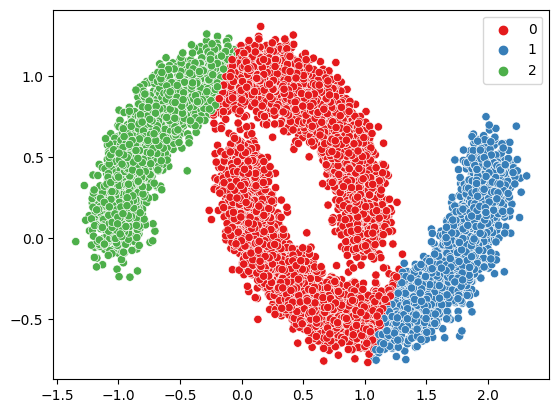

In [ ]:
gmm_6 = GaussianMixture(n_components=3, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'random_from_data')
gmm_6.fit(X)
clusters_gmm_6 = gmm_6.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_6, palette="Set1")

На мою думку, незважаючи на те, що мим мали 2 кластери, для цієї моделі та даних, n_components=2 - поганий вибір. **Найкращий варант n_components=4 та об'єднання кластерів постфактум.**

<Axes: >

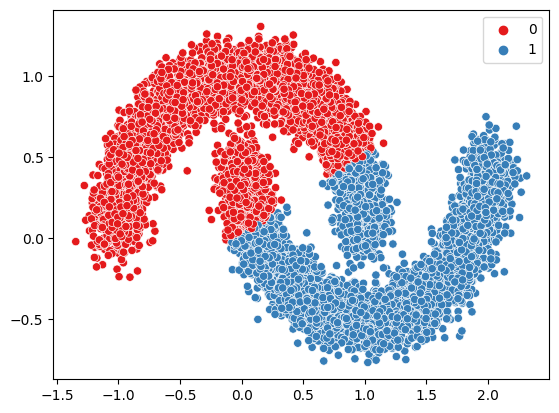

In [ ]:
gmm_7 = GaussianMixture(n_components=2, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'kmeans')
gmm_7.fit(X)
clusters_gmm_7 = gmm_7.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_7, palette="Set1")

В цілому всі параметри є дуже впливовимим.

### BayesianGaussianMixture

Я використаю знання з експериментів з GaussianMixture та залишу covariance_type= 'full', init_params = 'kmeans'.  
Тепер нас ціккавлять weight_concentration_prior_type та weight_concentration_prior.

<Axes: >

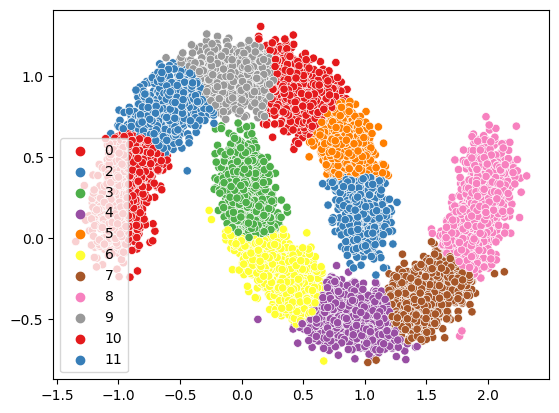

In [ ]:
  bgmm_1 = BayesianGaussianMixture(n_components=12, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 10000)
  bgmm_1.fit(X)
  clusters_bgmm_1 = bgmm_1.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_1, palette="Set1")

<Axes: >

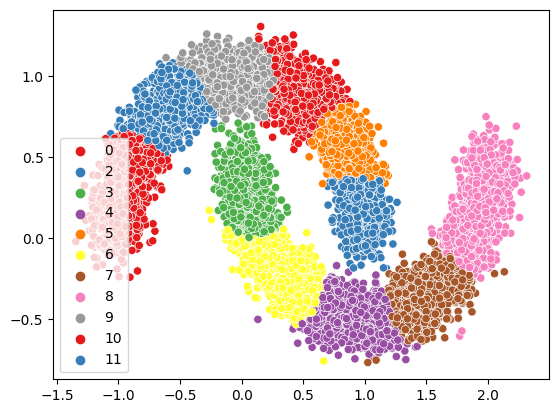

In [ ]:
  bgmm_2 = BayesianGaussianMixture(n_components=12, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 0.00001)
  bgmm_2.fit(X)
  clusters_bgmm_2 = bgmm_2.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_2, palette="Set1")

<Axes: >

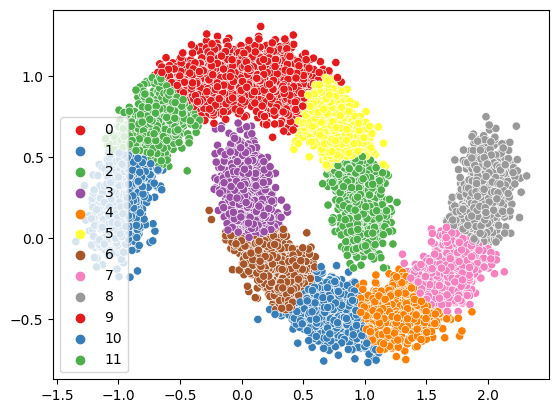

In [ ]:
  bgmm_4 = BayesianGaussianMixture(n_components=12, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_distribution', weight_concentration_prior = 10000)
  bgmm_4.fit(X)
  clusters_bgmm_4 = bgmm_4.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_4, palette="Set1")

<Axes: >

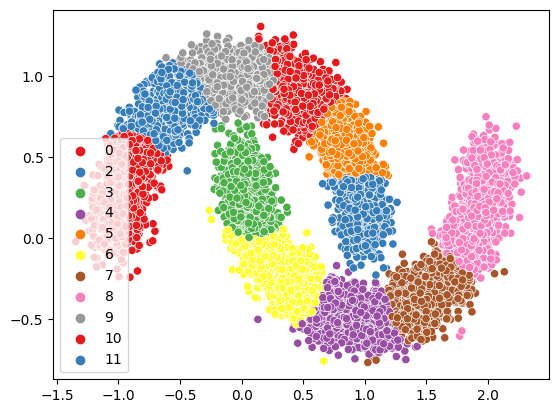

In [ ]:
  bgmm_3 = BayesianGaussianMixture(n_components=12, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_distribution', weight_concentration_prior = 0.00001)
  bgmm_3.fit(X)
  clusters_bgmm_3 = bgmm_3.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_3, palette="Set1")

На цьому датасеті немає якоїсь принципової різниці, чкщо чесно.

## Метрики
Homogeneity, Completeness, V-measure.

### GaussianMixture

In [ ]:
homogeneity_gmm_1 = homogeneity_score(y, clusters_gmm_1)
completeness_gmm_1 = completeness_score(y, clusters_gmm_1)
v_measure_gmm_1 = v_measure_score(y, clusters_gmm_1)
print(f'For GMM 1 \n homogeneity: {homogeneity_gmm_1}, \n completeness: {completeness_gmm_1}, \n V measure: {v_measure_gmm_1} \n' )

homogeneity_gmm_2 = homogeneity_score(y, clusters_gmm_2)
completeness_gmm_2 = completeness_score(y, clusters_gmm_2)
v_measure_gmm_2 = v_measure_score(y, clusters_gmm_2)
print(f'For GMM 2 \n homogeneity: {homogeneity_gmm_2}, \n completeness: {completeness_gmm_2}, \n V measure: {v_measure_gmm_2} \n' )

homogeneity_gmm_3 = homogeneity_score(y, clusters_gmm_3)
completeness_gmm_3 = completeness_score(y, clusters_gmm_3)
v_measure_gmm_3 = v_measure_score(y, clusters_gmm_3)
print(f'For GMM 3 \n homogeneity: {homogeneity_gmm_3}, \n completeness: {completeness_gmm_3}, \n V measure: {v_measure_gmm_3} \n' )

homogeneity_gmm_4 = homogeneity_score(y, clusters_gmm_4)
completeness_gmm_4 = completeness_score(y, clusters_gmm_4)
v_measure_gmm_4 = v_measure_score(y, clusters_gmm_4)
print(f'For GMM 4 \n homogeneity: {homogeneity_gmm_4}, \n completeness: {completeness_gmm_4}, \n V measure: {v_measure_gmm_4} \n' )

homogeneity_gmm_5 = homogeneity_score(y, clusters_gmm_5)
completeness_gmm_5 = completeness_score(y, clusters_gmm_5)
v_measure_gmm_5 = v_measure_score(y, clusters_gmm_5)
print(f'For GMM 5 \n homogeneity: {homogeneity_gmm_5}, \n completeness: {completeness_gmm_5}, \n V measure: {v_measure_gmm_5} \n' )

homogeneity_gmm_6 = homogeneity_score(y, clusters_gmm_6)
completeness_gmm_6 = completeness_score(y, clusters_gmm_6)
v_measure_gmm_6 = v_measure_score(y, clusters_gmm_6)
print(f'For GMM 6 \n homogeneity: {homogeneity_gmm_6}, \n completeness: {completeness_gmm_6}, \n V measure: {v_measure_gmm_6} \n' )

homogeneity_gmm_7 = homogeneity_score(y, clusters_gmm_7)
completeness_gmm_7 = completeness_score(y, clusters_gmm_7)
v_measure_gmm_7 = v_measure_score(y, clusters_gmm_7)
print(f'For GMM 7 \n homogeneity: {homogeneity_gmm_7}, \n completeness: {completeness_gmm_7}, \n V measure: {v_measure_gmm_7} \n' )

For GMM 1 
 homogeneity: 0.9889968981491922, 
 completeness: 0.32613844442411644, 
 V measure: 0.4905197198510757 

For GMM 2 
 homogeneity: 0.8793725185007925, 
 completeness: 0.3147524156709715, 
 V measure: 0.4635773302309716 

For GMM 3 
 homogeneity: 0.971476371815622, 
 completeness: 0.48676224727991413, 
 V measure: 0.6485605520687819 

For GMM 4 
 homogeneity: 0.9889968981491922, 
 completeness: 0.32613844442411644, 
 V measure: 0.4905197198510757 

For GMM 5 
 homogeneity: 0.9904564861901668, 
 completeness: 0.3320766794274513, 
 V measure: 0.49739017455613416 

For GMM 6 
 homogeneity: 0.4525161398489734, 
 completeness: 0.3129519411992005, 
 V measure: 0.3700109982268292 

For GMM 7 
 homogeneity: 0.40441548114013776, 
 completeness: 0.40444017452434566, 
 V measure: 0.40442782745531214 



З цікавого, незважаючи на те, що моделі 1 та 4 абсолютно різні, в них однакові метрики.

**Судячи з метрик, модель 3 - накраща - з значним відривом**.   
Після неї йде модель 5, але якщо порінвяти лише V Measure, то 3: 0.648 ,а 5: 0.497. Тобто відрив в ~0.15, що досить багато.

В принципі, я одразу й сказав, що це найкраща модель, отже справдня кількість кластерів може бути гіршоє за деяку іншу кількість, в залежності від методу кластерізації. (Модель 7 - два кластери: V Measure = 0.40)

<Axes: >

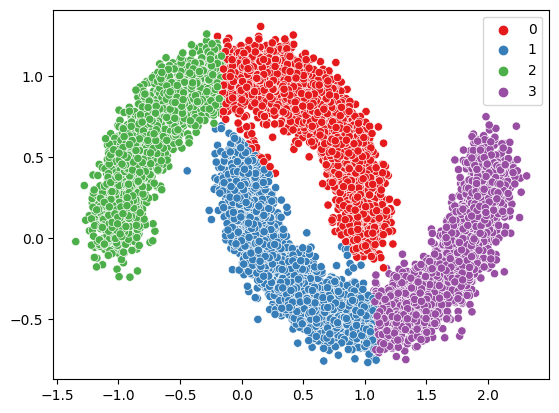

In [ ]:
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_3, palette="Set1")

### BayesianGaussianMixture

In [ ]:
homogeneity_bgmm_1 = homogeneity_score(y, clusters_bgmm_1)
completeness_bgmm_1 = completeness_score(y, clusters_bgmm_1)
v_measure_bgmm_1 = v_measure_score(y, clusters_bgmm_1)
print(f'For BGMM 1 \n homogeneity: {homogeneity_bgmm_1}, \n completeness: {completeness_bgmm_1}, \n V measure: {v_measure_bgmm_1} \n' )

homogeneity_bgmm_2 = homogeneity_score(y, clusters_bgmm_2)
completeness_bgmm_2 = completeness_score(y, clusters_bgmm_2)
v_measure_bgmm_2 = v_measure_score(y, clusters_bgmm_2)
print(f'For BGMM 2 \n homogeneity: {homogeneity_bgmm_2}, \n completeness: {completeness_bgmm_2}, \n V measure: {v_measure_bgmm_2} \n' )

homogeneity_bgmm_3 = homogeneity_score(y, clusters_bgmm_3)
completeness_bgmm_3 = completeness_score(y, clusters_bgmm_3)
v_measure_bgmm_3 = v_measure_score(y, clusters_bgmm_3)
print(f'For BGMM 3 \n homogeneity: {homogeneity_bgmm_3}, \n completeness: {completeness_bgmm_3}, \n V measure: {v_measure_bgmm_3} \n' )

homogeneity_bgmm_4 = homogeneity_score(y, clusters_bgmm_4)
completeness_bgmm_4 = completeness_score(y, clusters_bgmm_4)
v_measure_bgmm_4 = v_measure_score(y, clusters_bgmm_4)
print(f'For BGMM 4 \n homogeneity: {homogeneity_bgmm_4}, \n completeness: {completeness_bgmm_4}, \n V measure: {v_measure_bgmm_4} \n' )


For BGMM 1 
 homogeneity: 0.9951998747511607, 
 completeness: 0.2894706174329514, 
 V measure: 0.44849029220502734 

For BGMM 2 
 homogeneity: 0.9960776147068368, 
 completeness: 0.2897490370348299, 
 V measure: 0.44891359077419557 

For BGMM 3 
 homogeneity: 0.9951981377331321, 
 completeness: 0.28946960677951017, 
 V measure: 0.4484889027965714 

For BGMM 4 
 homogeneity: 0.9960486756726827, 
 completeness: 0.27789342096615166, 
 V measure: 0.43454937969595775 



Можна побачити, що жодна з цих моделей не гарна. Всі моделі - погані. Їх об'єднує велика кількість кластерів.
**Отже, ключом для побудова гарної моделі для цього датасету - правильна кількість кластерів (4).**

## Неформальний аналіз
Стабільність розбиття на пiдвибiрках даних

Для найкращої моделі, я буду розділяти початкові дані на піднабори з разною рандомизацією, а потім перевіряти метрику V-measure.

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
for ratio in range (2,10,1):

  X_train, _, _, _ = train_test_split(X, y, test_size=ratio/10)
  gmm = GaussianMixture(n_components=4, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'kmeans')
  gmm.fit(X_train)
  clusters_gmm = gmm.predict(X)

  v_measure_gmm = v_measure_score(y, clusters_gmm)
  print(f'For GMM \n  V-measure: {v_measure_gmm} \n' )


For GMM 
  V-measure: 0.6537493904465046 

For GMM 
  V-measure: 0.6428925455435662 

For GMM 
  V-measure: 0.6509182963634065 

For GMM 
  V-measure: 0.6539579981332097 

For GMM 
  V-measure: 0.6544378791070691 

For GMM 
  V-measure: 0.6493293601963044 

For GMM 
  V-measure: 0.6551700857438132 

For GMM 
  V-measure: 0.6493035290753091 



На мою думку можна заявити, що розбиття стабільно гарне на підвиборках даних.

Пара графічних прикладів:

<Axes: >

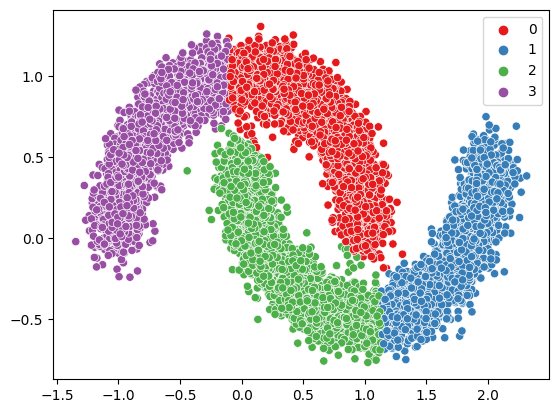

In [ ]:
X_train, _, _, _ = train_test_split(X, y, test_size = 0.4, random_state=64)
gmm = GaussianMixture(n_components=4, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'kmeans')
gmm.fit(X_train)
clusters_gmm = gmm.predict(X)
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm, palette="Set1")

<Axes: >

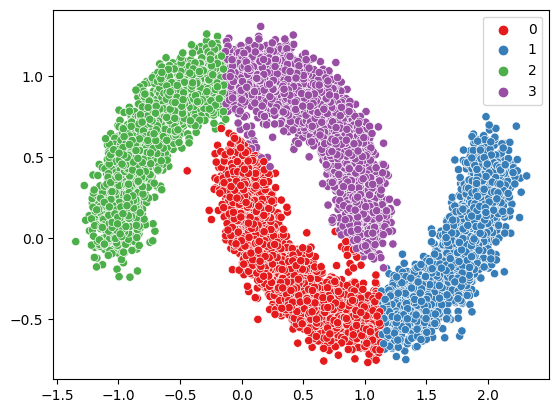

In [ ]:
X_train, _, _, _ = train_test_split(X, y, test_size = 0.64, random_state=76)
gmm = GaussianMixture(n_components=4, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'kmeans')
gmm.fit(X_train)
clusters_gmm = gmm.predict(X)
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm, palette="Set1")

Вони виглядають майже однаково. Отже розбиття стабільне в незалежності від підвибірки, крім, можливо, якихось екстремальних випадків.

## Проміжні висновки

Було опрацьовано перший датасет make_moonsю Були опрцьовані моделі GaussianMixture та BayesianGaussianMixture. На цьому датасеті особливої різниці між нимим не було.  
Найкраща модель була побудована за параметрами:  
GaussianMixture(n_components=4, random_state=42, max_iter = 1000),  
тобто були використані майже стандартні параметри.   
Ключом для побудови гарної моделі було обрання правильної кількості кластерів - 4.

# Другий датасет

## Генерація даних

In [ ]:
np.random.seed(0)
n_points_per_cluster = 10000
C1 = [ -6, -2] + 0.7 * np.random.randn(n_points_per_cluster, 2)
C2 = [ -2,  2] + 0.3 * np.random.randn(n_points_per_cluster, 2)
C3 = [  1, -2] + 0.2 * np.random.randn(n_points_per_cluster, 2)
C4 = [  4, -4] + 0.1 * np.random.randn(n_points_per_cluster, 2)
C5 = [  5,  0] + 1.4 * np.random.randn(n_points_per_cluster, 2)
C6 = [  5,  6] + 2.0 * np.random.randn(n_points_per_cluster, 2)
X = np.vstack((C1, C2, C3, C4, C5, C6))
y = np.concatenate([np.full(n_points_per_cluster, i) for i in range(6)])

## Графічне представлення даних

(<Axes: >,)

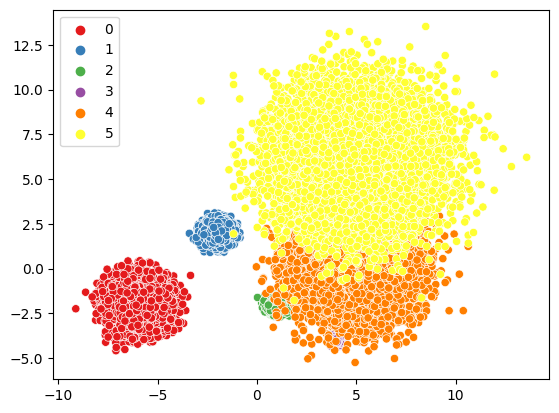

In [ ]:
sns.scatterplot(x = X[:, 0], y = X[:, 1], hue = y, palette="Set1" ),

Візуально можна побачити, як саме наші дані образовані. Можно побачити кластер 0, 1, кусочок 2, частину 4 та кластер 5. Кластер 3 десь під іншим кластером.  
Взагалі, я б вважав гарним результатом відокремлення Тьрох кластерів: 1, 2 та велика об'єднання 2-5.

## Побудова моделей

В моєму варіанту вкзано, що треба бдувати дві моделі:  
 - GaussianMixture,  
 - BayesianGaussianMixture.  

Відповідно, буде побудовано дві моделі в кожному кроці.  

**Важливо зауважити**, що я не буду використовувати **не** необхідні параметри обох моделей на цьому кроці та спеціально створю дві максимально прості. Експерементування з параметрами та спроба побудувати гарну модель буде в відповідному розіді далі.

### GaussianMixture

In [ ]:
gmm = GaussianMixture(n_components=6, random_state=42)
gmm.fit(X)

GaussianMixture(n_components=10, random_state=42)

### BayesianGaussianMixture

In [ ]:
bgmm = BayesianGaussianMixture(n_components=6, random_state=42)
bgmm.fit(X)

/usr/local/lib/python3.10/dist-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


BayesianGaussianMixture(n_components=10, random_state=42)

## Кластерізація

### GaussianMixture

In [ ]:
clusters_gmm = gmm.predict(X)

### BayesianGaussianMixture

In [ ]:
clusters_bgmm = bgmm.predict(X)

## Візуалізація

### GaussianMixture

In [ ]:
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm, palette="Set1")
plt.title('Шість кластерів')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

Тут дивні кусочки синього кластера праворуч.

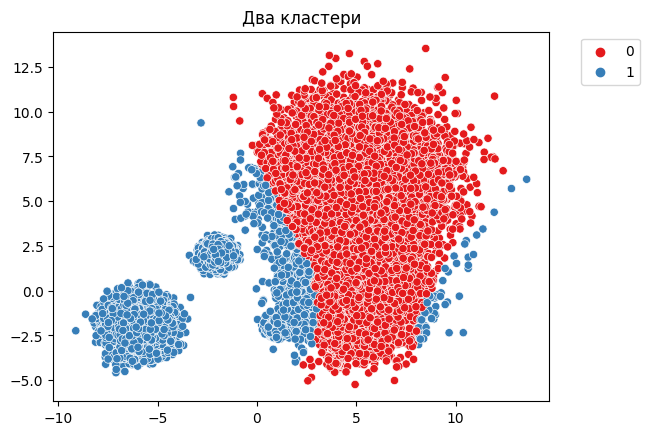

Це здивувало мене найсильніше. Чомусь синя "річечка" знизу більш гарно визначається як кластер алгоритмом, ніж маленький "островок".

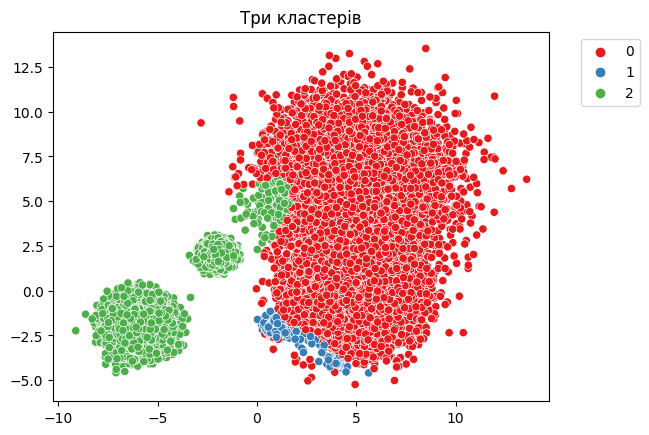

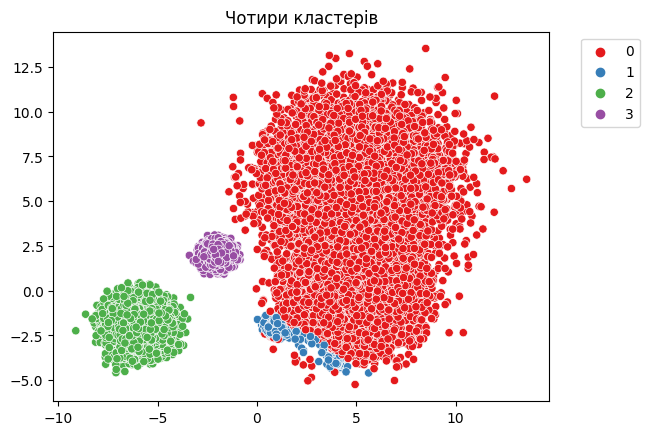

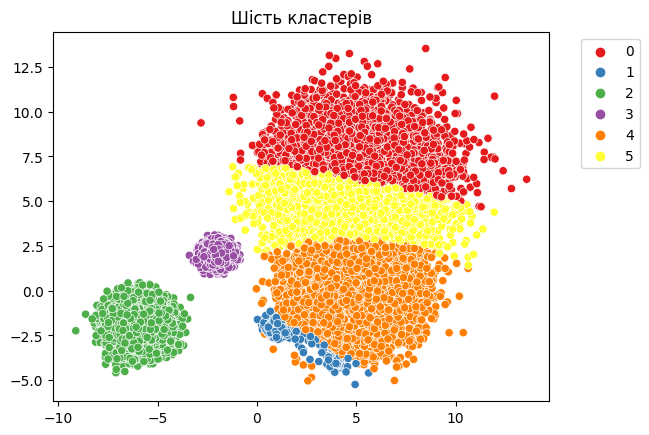

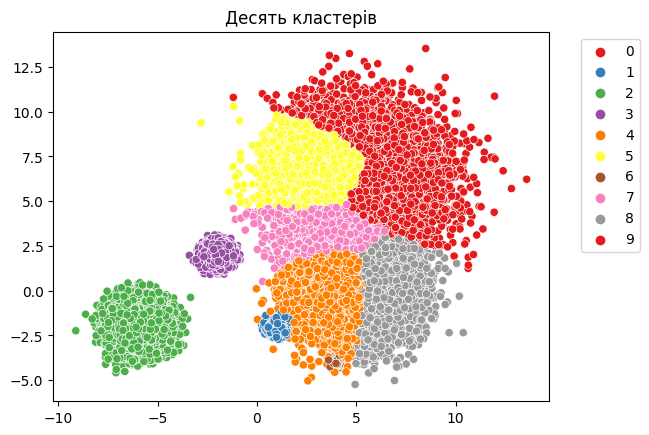

Отже можна помітити, що "найсильніши" кластери це: великий кластер праворуч, островки ліворуч (як група, або лише великий), річечка знизу.

### BayesianGaussianMixture

**Принципово, кластери майже такі самі як в GaussianMixture.** Вони мають дещо різні межі, але образовувалися схожим чином, напевно вони навіть краще виглядають. Додаткових коментарів більше не буде в цьому розділі.

In [ ]:
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm, palette="Set1")
plt.title('Шість кластерів')

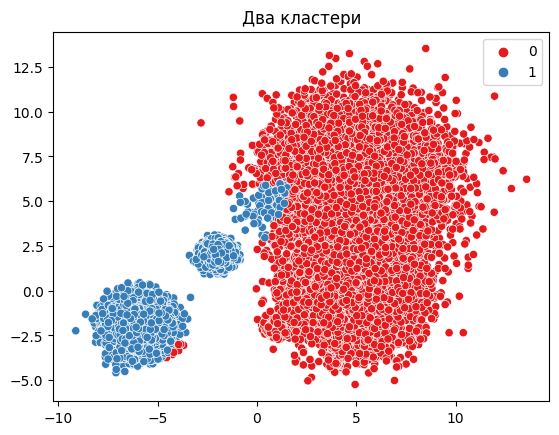

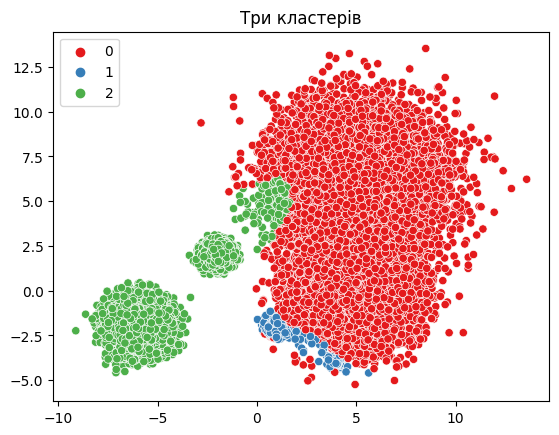

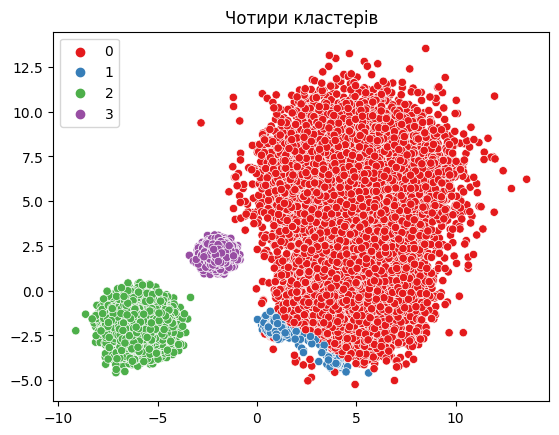

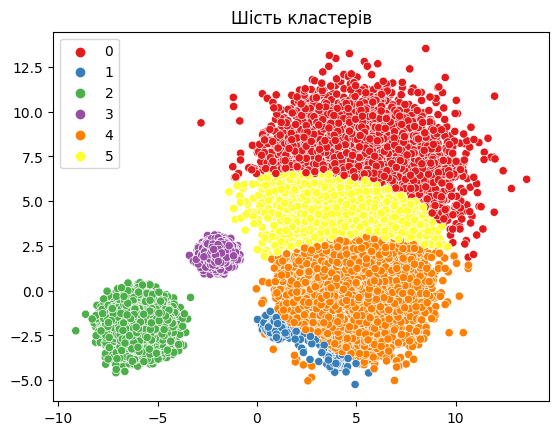

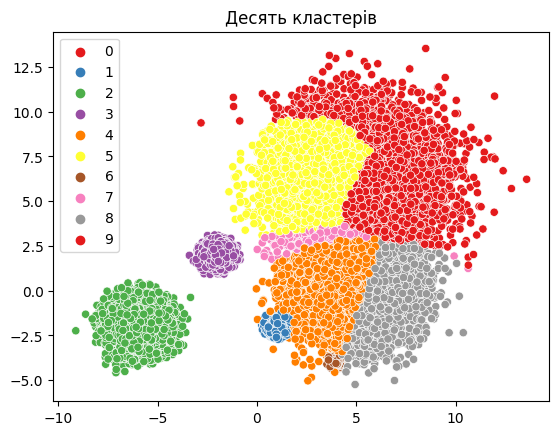

## Оцінка часу
В цьому розілі я створю декілька датасетів make_moons з різними розмірами: 1000, 5000, 10000, 50000, 100000. Буде заміряний час.

### Бібліотека для заміру часу

In [ ]:
import time

### GaussianMixture

In [ ]:
time_dict = {}
for cap in range(1000, 21000, 1000):

  np.random.seed(0)
  n_points_per_cluster = cap
  C1 = [ -6, -2] + 0.7 * np.random.randn(n_points_per_cluster, 2)
  C2 = [ -2,  2] + 0.3 * np.random.randn(n_points_per_cluster, 2)
  C3 = [  1, -2] + 0.2 * np.random.randn(n_points_per_cluster, 2)
  C4 = [  4, -4] + 0.1 * np.random.randn(n_points_per_cluster, 2)
  C5 = [  5,  0] + 1.4 * np.random.randn(n_points_per_cluster, 2)
  C6 = [  5,  6] + 2.0 * np.random.randn(n_points_per_cluster, 2)
  X_t = np.vstack((C1, C2, C3, C4, C5, C6))

  start_time = time.time()

  gmm_t = GaussianMixture(n_components=2, random_state=42, max_iter = 1000)
  gmm_t.fit(X_t)
  clusters_gmm_t = gmm_t.predict(X_t)

  end_time = time.time()
  elapsed_time = end_time - start_time
  time_dict[cap] = elapsed_time

  print(f"Час виконання для розміру {cap}: {end_time - start_time} секунд")

Час виконання для розміру 1000: 0.1257033348083496 секунд
Час виконання для розміру 2000: 0.06143546104431152 секунд
Час виконання для розміру 3000: 0.2678871154785156 секунд
Час виконання для розміру 4000: 0.0884709358215332 секунд
Час виконання для розміру 5000: 0.161818265914917 секунд
Час виконання для розміру 6000: 0.43459296226501465 секунд
Час виконання для розміру 7000: 0.5110015869140625 секунд
Час виконання для розміру 8000: 0.2128293514251709 секунд
Час виконання для розміру 9000: 0.614295244216919 секунд
Час виконання для розміру 10000: 0.7014245986938477 секунд
Час виконання для розміру 11000: 1.0960907936096191 секунд
Час виконання для розміру 12000: 1.1333849430084229 секунд
Час виконання для розміру 13000: 2.265714406967163 секунд
Час виконання для розміру 14000: 2.6808648109436035 секунд
Час виконання для розміру 15000: 1.5908660888671875 секунд
Час виконання для розміру 16000: 0.6543807983398438 секунд
Час виконання для розміру 17000: 1.789048194885254 секунд
Час вико

### BayesianGaussianMixture

In [ ]:
time_dict_2 = {}
for cap in range(1000, 21000, 1000):

  np.random.seed(0)
  n_points_per_cluster = cap
  C1 = [ -6, -2] + 0.7 * np.random.randn(n_points_per_cluster, 2)
  C2 = [ -2,  2] + 0.3 * np.random.randn(n_points_per_cluster, 2)
  C3 = [  1, -2] + 0.2 * np.random.randn(n_points_per_cluster, 2)
  C4 = [  4, -4] + 0.1 * np.random.randn(n_points_per_cluster, 2)
  C5 = [  5,  0] + 1.4 * np.random.randn(n_points_per_cluster, 2)
  C6 = [  5,  6] + 2.0 * np.random.randn(n_points_per_cluster, 2)
  X_t = np.vstack((C1, C2, C3, C4, C5, C6))
  start_time = time.time()

  bgmm_t = BayesianGaussianMixture(n_components=2, random_state=42, max_iter = 1000)
  bgmm_t.fit(X_t)
  clusters_bgmm_t = bgmm_t.predict(X_t)

  end_time = time.time()
  elapsed_time = end_time - start_time
  time_dict_2[cap] = elapsed_time

  print(f"Час виконання для розміру {cap}: {end_time - start_time} секунд")

Час виконання для розміру 1000: 0.30159854888916016 секунд
Час виконання для розміру 2000: 0.24054241180419922 секунд
Час виконання для розміру 3000: 3.3885533809661865 секунд
Час виконання для розміру 4000: 0.33457422256469727 секунд
Час виконання для розміру 5000: 0.313274621963501 секунд
Час виконання для розміру 6000: 3.102801561355591 секунд
Час виконання для розміру 7000: 5.292596101760864 секунд
Час виконання для розміру 8000: 1.8659234046936035 секунд
Час виконання для розміру 9000: 2.769778251647949 секунд
Час виконання для розміру 10000: 3.0281143188476562 секунд
Час виконання для розміру 11000: 7.320164203643799 секунд
Час виконання для розміру 12000: 6.936236143112183 секунд
Час виконання для розміру 13000: 8.723598003387451 секунд
Час виконання для розміру 14000: 7.452764272689819 секунд
Час виконання для розміру 15000: 9.168553113937378 секунд
Час виконання для розміру 16000: 4.099752187728882 секунд
Час виконання для розміру 17000: 9.399695634841919 секунд
Час виконання 

Графічне порівняння

In [ ]:
df_gmm = pd.DataFrame(list(time_dict.items()), columns=['Samples', 'Time'])
df_gmm['Model'] = 'GaussianMixture'

df_bgmm = pd.DataFrame(list(time_dict_2.items()), columns=['Samples', 'Time'])
df_bgmm['Model'] = 'BayesianGaussianMixture'

df = pd.concat([df_gmm, df_bgmm])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, '1000'),
  Text(1, 0, '2000'),
  Text(2, 0, '3000'),
  Text(3, 0, '4000'),
  Text(4, 0, '5000'),
  Text(5, 0, '6000'),
  Text(6, 0, '7000'),
  Text(7, 0, '8000'),
  Text(8, 0, '9000'),
  Text(9, 0, '10000'),
  Text(10, 0, '11000'),
  Text(11, 0, '12000'),
  Text(12, 0, '13000'),
  Text(13, 0, '14000'),
  Text(14, 0, '15000'),
  Text(15, 0, '16000'),
  Text(16, 0, '17000'),
  Text(17, 0, '18000'),
  Text(18, 0, '19000'),
  Text(19, 0, '20000')])

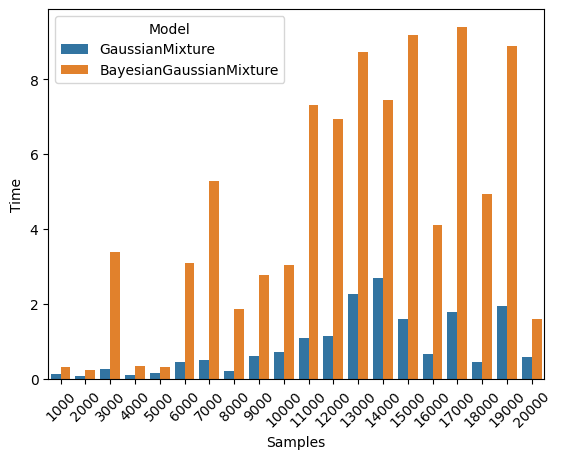

In [ ]:
sns.barplot(x='Samples', y='Time', data=df, hue = 'Model')
plt.xticks(rotation=45)

### **Ситуація аналогічна до першого датасету!**  

Можно побачити, що BayesianGaussianMixture стабільно займає значно більше часу, ніж GaussianMixture. Також можно побачити якісь дивні затримки та пришвидшення для BayesianGaussianMixture. Я прогнав цей тест декілька разів, але це відбуваєтсья стабільно з'являються.  
 **Отже BayesianGaussianMixture менш сатбільний за часом ніж GaussianMixture та займає значно більше часу.**

## Побудова алтернативних моделей

### GaussianMixture
Тут з цікавих параметрів covariance_type, init_params та, звичайно, n_components.

**Є загальна проблема всіх GMM моделей - вони об'єднують два маленьких кластера в низу праваї фігури в один прямокутник.**

<Axes: >

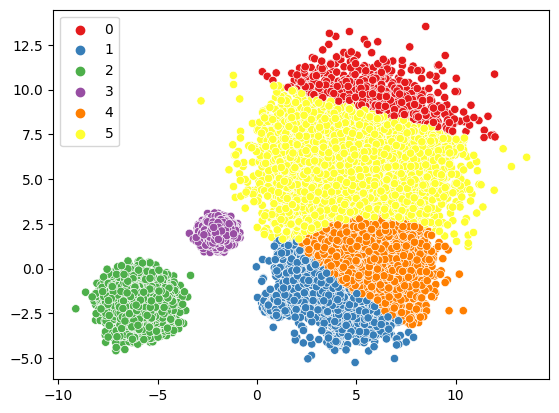

In [ ]:
gmm_1 = GaussianMixture(n_components=6, random_state=42, max_iter = 1000, covariance_type= 'spherical', init_params = 'k-means++')
gmm_1.fit(X)
clusters_gmm_1 = gmm_1.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_1, palette="Set1")

<Axes: >

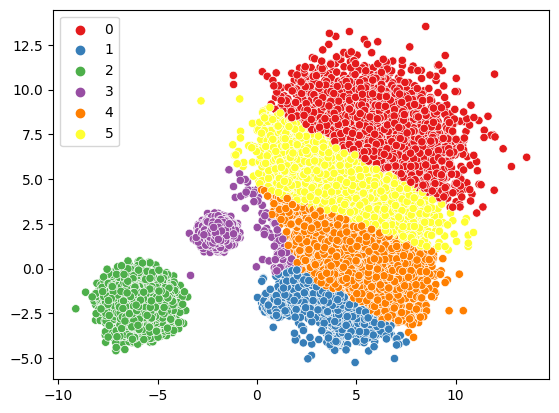

In [ ]:
gmm_2 = GaussianMixture(n_components=6, random_state=42, max_iter = 1000, covariance_type= 'tied', init_params = 'kmeans')
gmm_2.fit(X)
clusters_gmm_2 = gmm_2.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_2, palette="Set1")

<Axes: >

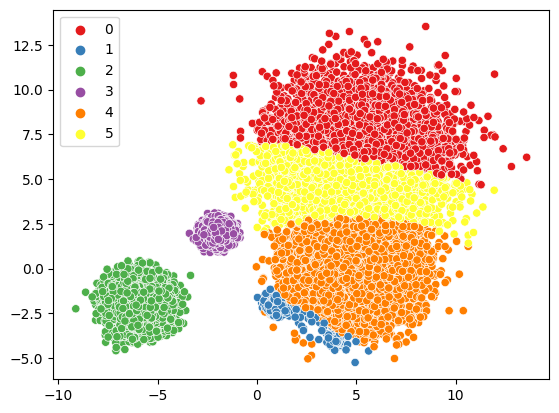

In [ ]:
gmm_3 = GaussianMixture(n_components=6, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'kmeans')
gmm_3.fit(X)
clusters_gmm_3 = gmm_3.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_3, palette="Set1")

<Axes: >

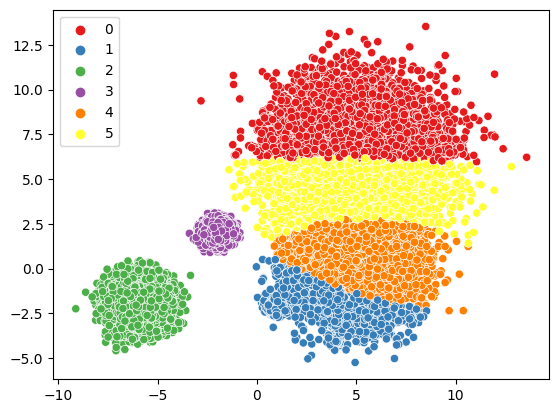

In [ ]:
gmm_4 = GaussianMixture(n_components=6, random_state=42, max_iter = 1000, covariance_type= 'diag', init_params = 'kmeans')
gmm_4.fit(X)
clusters_gmm_4 = gmm_4.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_4, palette="Set1")

Найгірше за все виглядає параметр tied. Найбліжчий до правди напевно знову full.

init_params = 'random' знову кластерізує погано.

<Axes: >

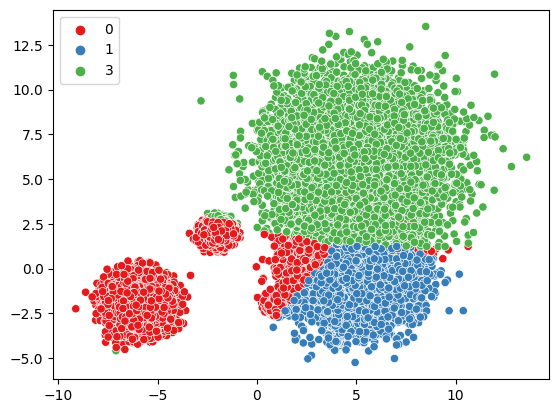

In [ ]:
gmm_5 = GaussianMixture(n_components=4, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'random')
gmm_5.fit(X)
clusters_gmm_5 = gmm_5.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_5, palette="Set1")

random_from_data робить набагато краще, але все одно можуть з'являтися дивні кластери як тут на лівому острові, тому не дуже ефективне значення параметра.

<Axes: >

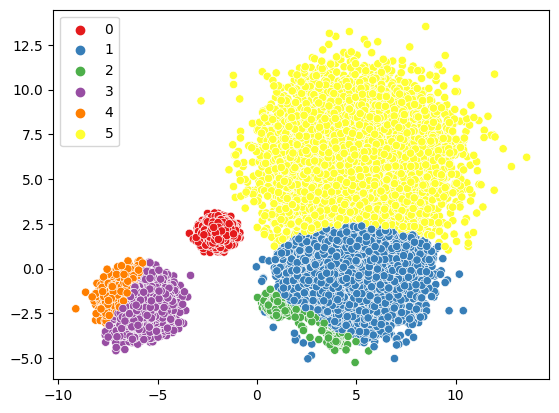

In [ ]:
gmm_5 = GaussianMixture(n_components=6, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'random_from_data')
gmm_5.fit(X)
clusters_gmm_5 = gmm_5.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_5, palette="Set1")

<Axes: >

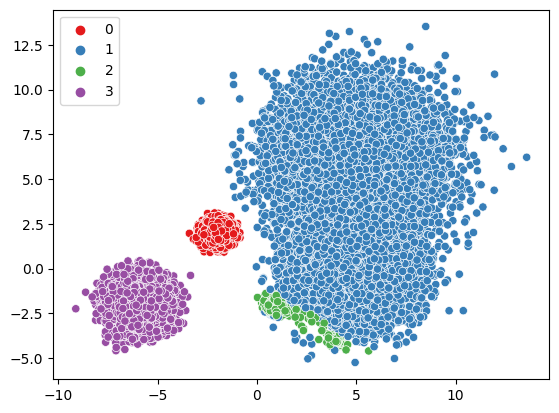

In [ ]:
gmm_6 = GaussianMixture(n_components=4, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'random_from_data')
gmm_6.fit(X)
clusters_gmm_6 = gmm_6.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_6, palette="Set1")

<Axes: >

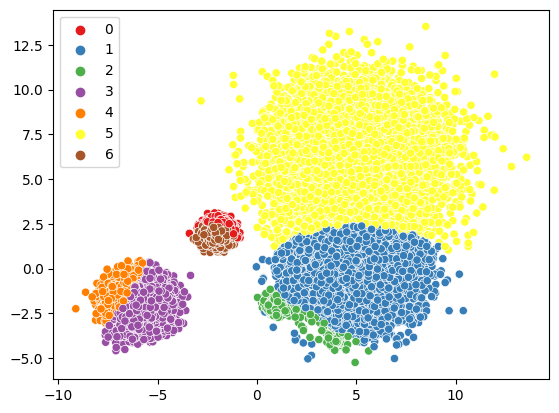

In [ ]:
gmm_7 = GaussianMixture(n_components=7, random_state=42, max_iter = 1000, covariance_type= 'full', init_params = 'random_from_data')
gmm_7.fit(X)
clusters_gmm_7 = gmm_7.predict(X)

sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_7, palette="Set1")

В цілому всі параметри є дуже впливовимим.

### BayesianGaussianMixture
**Майже всі BGMM моделі розрязняють два кластери в низу правої фігури**

<Axes: >

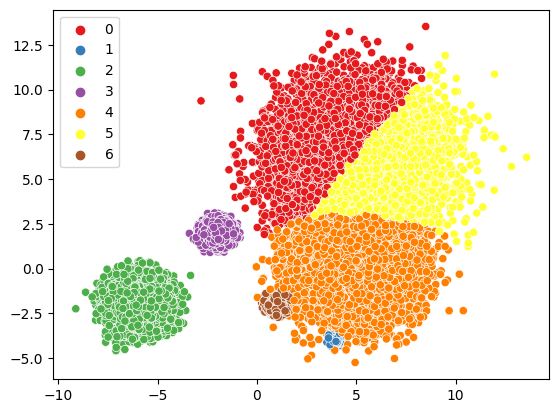

In [ ]:
  bgmm_1 = BayesianGaussianMixture(n_components=7, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 1000)
  bgmm_1.fit(X)
  clusters_bgmm_1 = bgmm_1.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_1, palette="Set1")

<Axes: >

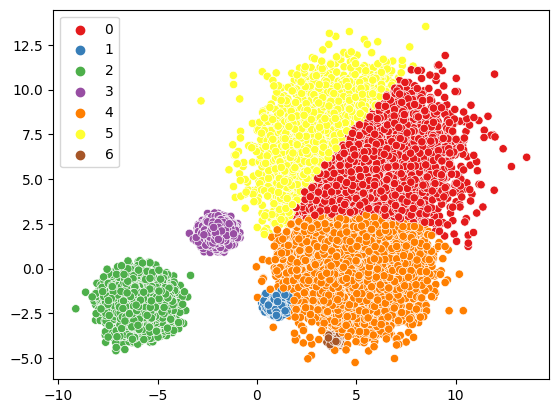

In [ ]:
  bgmm_2 = BayesianGaussianMixture(n_components=8, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 0.001)
  bgmm_2.fit(X)
  clusters_bgmm_2 = bgmm_2.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_2, palette="Set1")

<Axes: >

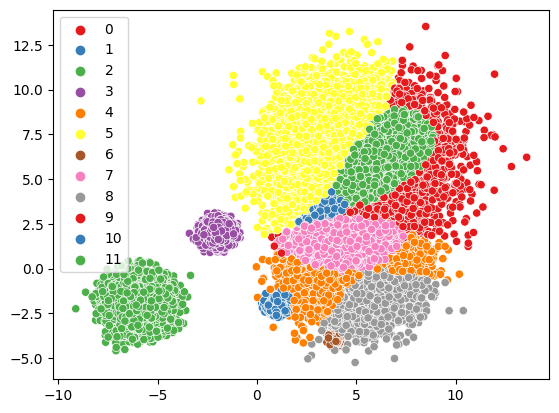

In [ ]:
  bgmm_4 = BayesianGaussianMixture(n_components=12, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_distribution', weight_concentration_prior = 1000)
  bgmm_4.fit(X)
  clusters_bgmm_4 = bgmm_4.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_4, palette="Set1")

/usr/local/lib/python3.10/dist-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


<Axes: >

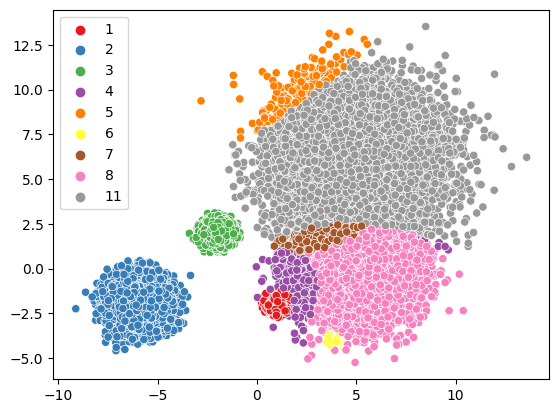

In [ ]:
  bgmm_3 = BayesianGaussianMixture(n_components=12, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_distribution', weight_concentration_prior = 0.001)
  bgmm_3.fit(X)
  clusters_bgmm_3 = bgmm_3.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_3, palette="Set1")

dirichlet_distribution поводить дивно та гірше ніж dirichlet_process. weight_concentration_prior як параметр поводиться неоднозначно.

/usr/local/lib/python3.10/dist-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


<Axes: >

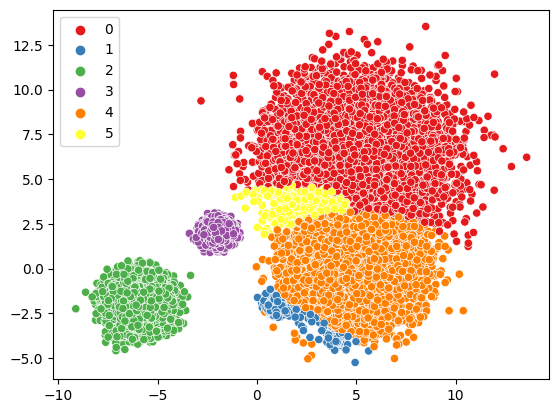

In [ ]:
  bgmm_5 = BayesianGaussianMixture(n_components=6, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 0.0001)
  bgmm_5.fit(X)
  clusters_bgmm_5 = bgmm_5.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_5, palette="Set1")

<Axes: >

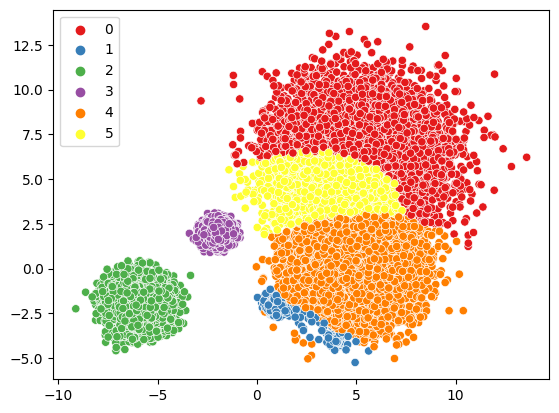

In [ ]:
  bgmm_6 = BayesianGaussianMixture(n_components=6, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 10000)
  bgmm_6.fit(X)
  clusters_bgmm_6 = bgmm_6.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_6, palette="Set1")

weight_concentration_prior впливає якось не кординально, скоріше змінює "баланс" між присутніми кластерами.

<Axes: >

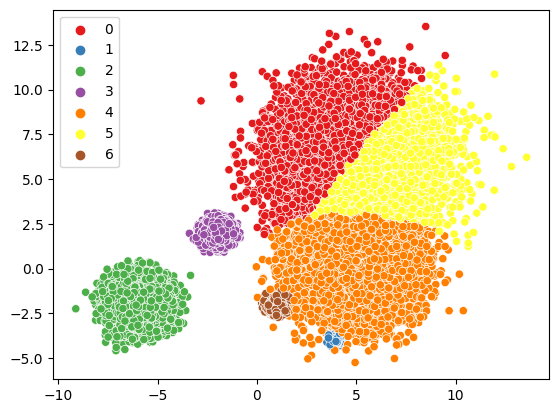

In [ ]:
  bgmm_7 = BayesianGaussianMixture(n_components=7, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 0.0001)
  bgmm_7.fit(X)
  clusters_bgmm_7 = bgmm_7.predict(X)
  sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_7, palette="Set1")

## Метрики
Homogeneity, Completeness, V-measure.

### GaussianMixture

In [ ]:
homogeneity_gmm_1 = homogeneity_score(y, clusters_gmm_1)
completeness_gmm_1 = completeness_score(y, clusters_gmm_1)
v_measure_gmm_1 = v_measure_score(y, clusters_gmm_1)
print(f'For GMM 1 \n homogeneity: {homogeneity_gmm_1}, \n completeness: {completeness_gmm_1}, \n V measure: {v_measure_gmm_1} \n' )

homogeneity_gmm_2 = homogeneity_score(y, clusters_gmm_2)
completeness_gmm_2 = completeness_score(y, clusters_gmm_2)
v_measure_gmm_2 = v_measure_score(y, clusters_gmm_2)
print(f'For GMM 2 \n homogeneity: {homogeneity_gmm_2}, \n completeness: {completeness_gmm_2}, \n V measure: {v_measure_gmm_2} \n' )

homogeneity_gmm_3 = homogeneity_score(y, clusters_gmm_3)
completeness_gmm_3 = completeness_score(y, clusters_gmm_3)
v_measure_gmm_3 = v_measure_score(y, clusters_gmm_3)
print(f'For GMM 3 \n homogeneity: {homogeneity_gmm_3}, \n completeness: {completeness_gmm_3}, \n V measure: {v_measure_gmm_3} \n' )

homogeneity_gmm_4 = homogeneity_score(y, clusters_gmm_4)
completeness_gmm_4 = completeness_score(y, clusters_gmm_4)
v_measure_gmm_4 = v_measure_score(y, clusters_gmm_4)
print(f'For GMM 4 \n homogeneity: {homogeneity_gmm_4}, \n completeness: {completeness_gmm_4}, \n V measure: {v_measure_gmm_4} \n' )

homogeneity_gmm_5 = homogeneity_score(y, clusters_gmm_5)
completeness_gmm_5 = completeness_score(y, clusters_gmm_5)
v_measure_gmm_5 = v_measure_score(y, clusters_gmm_5)
print(f'For GMM 5 \n homogeneity: {homogeneity_gmm_5}, \n completeness: {completeness_gmm_5}, \n V measure: {v_measure_gmm_5} \n' )

homogeneity_gmm_6 = homogeneity_score(y, clusters_gmm_6)
completeness_gmm_6 = completeness_score(y, clusters_gmm_6)
v_measure_gmm_6 = v_measure_score(y, clusters_gmm_6)
print(f'For GMM 6 \n homogeneity: {homogeneity_gmm_6}, \n completeness: {completeness_gmm_6}, \n V measure: {v_measure_gmm_6} \n' )

homogeneity_gmm_7 = homogeneity_score(y, clusters_gmm_7)
completeness_gmm_7 = completeness_score(y, clusters_gmm_7)
v_measure_gmm_7 = v_measure_score(y, clusters_gmm_7)
print(f'For GMM 7 \n homogeneity: {homogeneity_gmm_7}, \n completeness: {completeness_gmm_7}, \n V measure: {v_measure_gmm_7} \n' )

For GMM 1 
 homogeneity: 0.7731525875435098, 
 completeness: 0.8807640753928112, 
 V measure: 0.8234574802533896 

For GMM 2 
 homogeneity: 0.791301605110011, 
 completeness: 0.8542428749997373, 
 V measure: 0.8215685036918597 

For GMM 3 
 homogeneity: 0.8372827241616208, 
 completeness: 0.8971650170421445, 
 V measure: 0.8661901441552904 

For GMM 4 
 homogeneity: 0.7825606017213863, 
 completeness: 0.8511355903209744, 
 V measure: 0.8154088660455155 

For GMM 5 
 homogeneity: 0.8330061161559219, 
 completeness: 0.9098031008385289, 
 V measure: 0.8697125768052794 

For GMM 6 
 homogeneity: 0.7353963333815712, 
 completeness: 0.9909608035512166, 
 V measure: 0.8442620890729315 

For GMM 7 
 homogeneity: 0.833190401433161, 
 completeness: 0.8858025647555298, 
 V measure: 0.8586913489885332 



Найкраща модель згідно метрик проілюстрована нижче. І це має сенс: якщо об'єднати кластери 3 та 4 лівого острова, то це дуже схоже на "правду". Але всі звичайні GMM моедлі об'єднують два кластери в один синій кластер "річечку".

<Axes: >

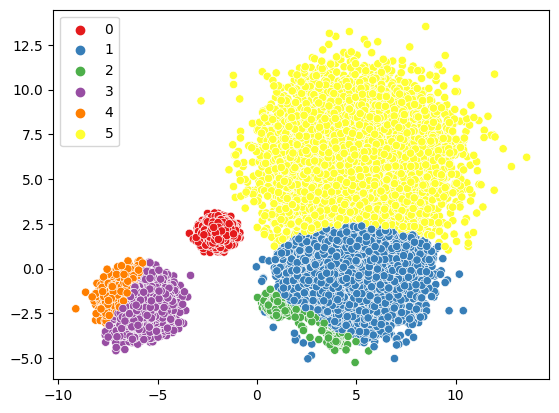

In [ ]:
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_gmm_5, palette="Set1")

### BayesianGaussianMixture

In [ ]:
homogeneity_bgmm_1 = homogeneity_score(y, clusters_bgmm_1)
completeness_bgmm_1 = completeness_score(y, clusters_bgmm_1)
v_measure_bgmm_1 = v_measure_score(y, clusters_bgmm_1)
print(f'For BGMM 1 \n homogeneity: {homogeneity_bgmm_1}, \n completeness: {completeness_bgmm_1}, \n V measure: {v_measure_bgmm_1} \n' )

homogeneity_bgmm_2 = homogeneity_score(y, clusters_bgmm_2)
completeness_bgmm_2 = completeness_score(y, clusters_bgmm_2)
v_measure_bgmm_2 = v_measure_score(y, clusters_bgmm_2)
print(f'For BGMM 2 \n homogeneity: {homogeneity_bgmm_2}, \n completeness: {completeness_bgmm_2}, \n V measure: {v_measure_bgmm_2} \n' )

homogeneity_bgmm_3 = homogeneity_score(y, clusters_bgmm_3)
completeness_bgmm_3 = completeness_score(y, clusters_bgmm_3)
v_measure_bgmm_3 = v_measure_score(y, clusters_bgmm_3)
print(f'For BGMM 3 \n homogeneity: {homogeneity_bgmm_3}, \n completeness: {completeness_bgmm_3}, \n V measure: {v_measure_bgmm_3} \n' )

homogeneity_bgmm_4 = homogeneity_score(y, clusters_bgmm_4)
completeness_bgmm_4 = completeness_score(y, clusters_bgmm_4)
v_measure_bgmm_4 = v_measure_score(y, clusters_bgmm_4)
print(f'For BGMM 4 \n homogeneity: {homogeneity_bgmm_4}, \n completeness: {completeness_bgmm_4}, \n V measure: {v_measure_bgmm_4} \n' )


homogeneity_bgmm_5 = homogeneity_score(y, clusters_bgmm_5)
completeness_bgmm_5 = completeness_score(y, clusters_bgmm_5)
v_measure_bgmm_5 = v_measure_score(y, clusters_bgmm_5)
print(f'For GMM 5 \n homogeneity: {homogeneity_bgmm_5}, \n completeness: {completeness_bgmm_5}, \n V measure: {v_measure_bgmm_5} \n' )

homogeneity_bgmm_6 = homogeneity_score(y, clusters_bgmm_6)
completeness_bgmm_6 = completeness_score(y, clusters_bgmm_6)
v_measure_bgmm_6 = v_measure_score(y, clusters_bgmm_6)
print(f'For GMM 6 \n homogeneity: {homogeneity_bgmm_6}, \n completeness: {completeness_bgmm_6}, \n V measure: {v_measure_bgmm_6} \n' )

homogeneity_bgmm_7 = homogeneity_score(y, clusters_bgmm_7)
completeness_bgmm_7 = completeness_score(y, clusters_bgmm_7)
v_measure_bgmm_7 = v_measure_score(y, clusters_bgmm_7)
print(f'For GMM 7 \n homogeneity: {homogeneity_bgmm_7}, \n completeness: {completeness_bgmm_7}, \n V measure: {v_measure_bgmm_7} \n' )

For BGMM 1 
 homogeneity: 0.9680156110103896, 
 completeness: 0.9119880468216908, 
 V measure: 0.9391669667241925 

For BGMM 2 
 homogeneity: 0.9681661222543463, 
 completeness: 0.9186502481513297, 
 V measure: 0.9427584606650817 

For BGMM 3 
 homogeneity: 0.9685823964271925, 
 completeness: 0.9196479692538456, 
 V measure: 0.9434811028558134 

For BGMM 4 
 homogeneity: 0.9728991588970576, 
 completeness: 0.8092826072584883, 
 V measure: 0.8835803203286533 

For GMM 5 
 homogeneity: 0.8358509658671932, 
 completeness: 0.9348741486632507, 
 V measure: 0.8825937506755945 

For GMM 6 
 homogeneity: 0.8367395792127853, 
 completeness: 0.8982319042778648, 
 V measure: 0.8663960102777215 

For GMM 7 
 homogeneity: 0.9680376370690537, 
 completeness: 0.9119898240332415, 
 V measure: 0.9391782753753345 



Нижче зображена найкраща модель кластерізації для цього датасету. Якщо об'єднати жовтий та червоний кластери, то це дуже близько до справжніх кластерів.

<Axes: >

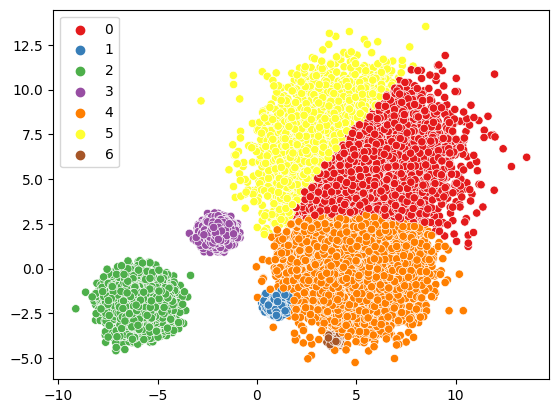

In [ ]:
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm_2, palette="Set1")

## Неформальний аналіз
Стабільність розбиття на пiдвибiрках даних

Для найкращої моделі, я буду розділяти початкові дані на піднабори з разною рандомизацією, а потім перевіряти метрику V-measure.

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
for ratio in range (2,10,1):

  X_train, _, _, _ = train_test_split(X, y, test_size=ratio/10)
  bgmm = BayesianGaussianMixture(n_components=8, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 0.001)
  bgmm.fit(X_train)
  clusters_bgmm = bgmm.predict(X)

  v_measure_bgmm = v_measure_score(y, clusters_bgmm)
  print(f'For GMM \n  V-measure: {v_measure_bgmm} \n' )


For GMM 
  V-measure: 0.939255892294827 

For GMM 
  V-measure: 0.9399221980458354 

For GMM 
  V-measure: 0.9404615196563744 

For GMM 
  V-measure: 0.9677802276809431 

For GMM 
  V-measure: 0.9681221625911746 

For GMM 
  V-measure: 0.9387197533675656 

For GMM 
  V-measure: 0.9675486105513049 

For GMM 
  V-measure: 0.9611670105442469 



На мою думку можна заявити, що розбиття стабільно гарне на підвиборках даних.

Пара графічних прикладів:

/usr/local/lib/python3.10/dist-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


<Axes: >

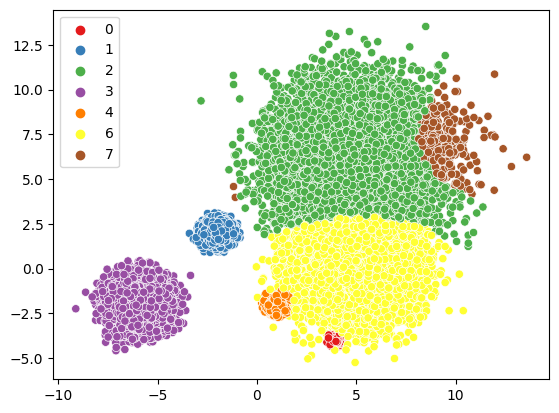

In [ ]:
X_train, _, _, _ = train_test_split(X, y, test_size= 0.40)
bgmm = BayesianGaussianMixture(n_components=8, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 0.001)
bgmm.fit(X_train)
clusters_bgmm = bgmm.predict(X)
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm, palette="Set1")

<Axes: >

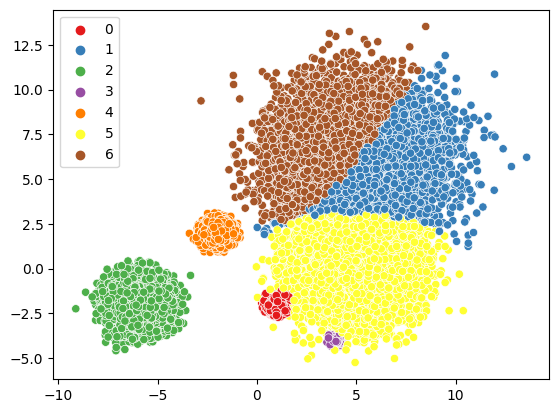

In [ ]:
X_train, _, _, _ = train_test_split(X, y, test_size= 0.30)
bgmm = BayesianGaussianMixture(n_components=8, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 0.001)
bgmm.fit(X_train)
clusters_bgmm = bgmm.predict(X)
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=clusters_bgmm, palette="Set1")

Можна помітити, що розбиття відрізняється лише виглядом верхнх кластерів правої фігури: 2 та 7, 1 та 6 для останніх двох прикладів. Тобто, якщо об'єдинити їх на обох прикладах, то кластеризація майже ідентична.

## Проміжні висновки

Було опрацьовано другий датасет. На відміну від першого датасету, BayesianGaussianMixture зміг показати свою сильну сторону та виявити більш скриті кластери.  
Було побудовано гарну модель кластерізації.  
Параметри:  
BayesianGaussianMixture(n_components=8, random_state=42, max_iter = 1000,
                                   weight_concentration_prior_type = 'dirichlet_process', weight_concentration_prior = 0.001)

# Висновки

Було опрацьовано два датасети. Було опрацьовано GaussianMixture та BayesianGaussianMixture.  
GaussianMixture працює значно швидше та дає той самий результат на простих датасетах.  
BayesianGaussianMixture повільниший, але ма єможливість бачити приховану структуру на більш складних датасетах.  
На першому датасеті себе краще показав GaussianMixture, бо датасет був простим.  
НА другому датасеті себе краще показав BayesianGaussianMixture, бо була прихована структура.